# **Lab 2.1 Image Enhancement with Math Operation**
This lab consists of two main subparts: Image Pixel Adjustment using Linear Equations and Gamma Equations.

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import random
import typing

Read an image using OpenCV (Use your own image).

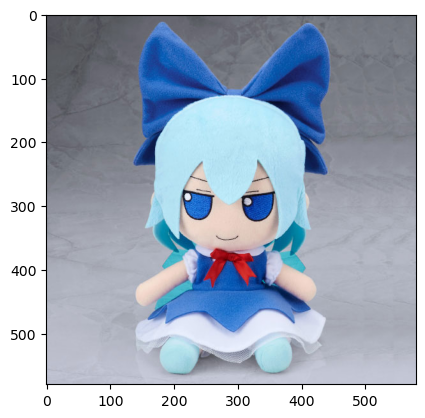

In [4]:
### START CODE HERE ###
img_path = './assets/cirno_fumo.jpg'
img = cv2.imread(img_path)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

random.seed(bytes(img_path, encoding='UTF-8'))
### END CODE HERE ###

## **Image Pixel Adjustment**

### Using Linear Equation
$$I_{new} = I \cdot a + b$$

Please perform at ***least 20 iterations*** with varying values of $a$ and $b$.
Assign the result of each iteration to an array.<br/>

In [5]:
class LinearAdjustment:
    def linear_adjustment(self, image: np.ndarray, a: float, b: float):
        float_image = image.astype(np.float64)
        adjusted_image = (float_image * a) + b
        # print(adjusted_image)
        return adjusted_image

    def format_for_display(self) -> np.ndarray:
        formatted_image_float = self.adjusted_raw
        # formatted_image_float = quantize(formatted_image_float, result_bitdepth=8)
        formatted_image_float = formatted_image_float.clip(min=0, max=255)
        formatted_image_uint8 = formatted_image_float.astype(np.uint8)
        return formatted_image_uint8

    def __init__(self, image: np.ndarray, a: float, b: float) -> None:
        self.a = a
        self.b = b
        self.original = image
        self.adjusted_raw = self.linear_adjustment(image, a, b)
        self.adjusted_display = self.format_for_display()

In [6]:
### START CODE HERE ###
linear_adjustments_count = 40

def generate_linear_adjustments(i: int) -> LinearAdjustment:
    a = (i / linear_adjustments_count)
    b = (i / linear_adjustments_count) * 100

    # print(a, b)
    return LinearAdjustment(img, a, b)

linear_adjustments: typing.List[LinearAdjustment] = list(map(generate_linear_adjustments, range(linear_adjustments_count)))
lin_result = list(map(lambda i: i.adjusted_display, linear_adjustments))

# for linear_adjustment in linear_adjustments:
#     print(linear_adjustment.a, linear_adjustment.b)
### END CODE HERE ###

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
- The reference output used 40 iterations.

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-1.png?raw=true)
</details>


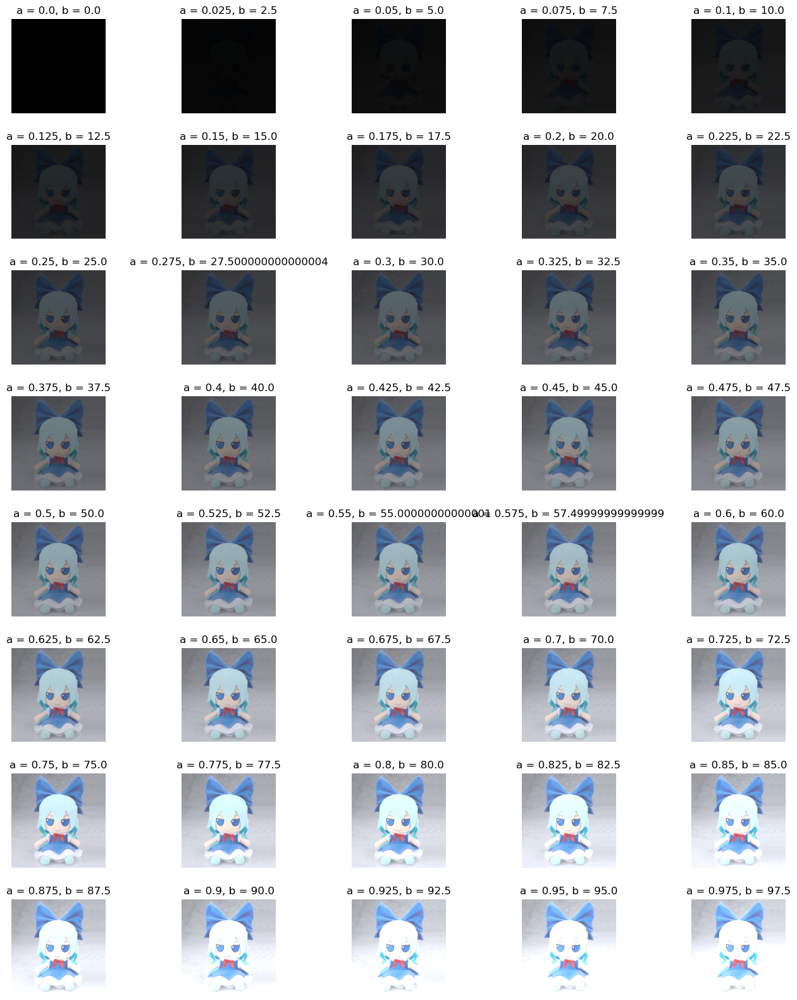

In [7]:
### START CODE HERE ###
fig = plt.figure(figsize=(32, 20))

grid = ImageGrid(
    fig, (1, 1, 1),
     nrows_ncols=(8, 5), axes_pad=(1.2, 0.5))
for i, ax in enumerate(grid):
    current_adjustment = linear_adjustments[i]
    ax.imshow(cv2.cvtColor(current_adjustment.adjusted_display, cv2.COLOR_BGR2RGB))
    ax.set_title(f'a = {current_adjustment.a}, b = {current_adjustment.b}')
    ax.axis('off')
# This only affects Axes in first column and second row as share_all=False.
grid.axes_llc.set(xticks=[-2, 0, 2], yticks=[-2, 0, 2])

plt.show()
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [8]:
assert len(lin_result) >= 20, f"Expected more than or equal 20 iterations but got {len(lin_result)}"
for idx, result in enumerate(lin_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Save the array of images to a video. Please complete the function below.

In [9]:
### START CODE HERE ###
def write_images_to_video(image_array: np.array, output_file: str, frame_rate=30):
    fourcc = cv2.VideoWriter_fourcc(*'h264')
    image_array_shape = image_array.shape
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (image_array_shape[2], image_array_shape[1]))
    for frame in image_array:
        out.write(frame.astype(np.uint8))
    out.release()
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [10]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_linear.mp4")
write_images_to_video(np.array(lin_result), output_file)

OpenCV: FFMPEG: tag 0x34363268/'h264' is not supported with codec id 27 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x31637661/'avc1'


Now use `matplotlib.animation` to display the animation from the images array.

In [11]:
%%capture
### START CODE HERE ###
figure, axes = plt.subplots()

frames = []
for i, frame in enumerate(lin_result):
    frame_uint8 = frame.astype(np.uint8)
    # frames.append(plt.imshow(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2RGB)))

    im = axes.imshow(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2RGB), animated=True)
    axes.axis('off')
    if i == 0:
        axes.imshow(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2RGB))  # show an initial one first
    frames.append([im])


ani = animation.ArtistAnimation(fig=figure, artists=frames, interval=50, blit=True)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![linear.gif](![<attachment:linear (2).gif>](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/linear.gif?raw=true))

</details>

In [12]:
display(HTML(ani.to_jshtml()))

### Gamma Equation
$$I_{new} = I^{\gamma} \cdot a + b$$

Where $a$ is 1 and $b$ is 0. 
Please perform ***at least 10 iterations*** for 0 < $\gamma$ < 1 and another ***at least 10 iterations*** for $\gamma$ > 1
Assign the result of each iteration to an array.<br/>


In [20]:
class GammaAdjustment:
    def gamma_adjustment(self, image: np.ndarray, gamma: float, a: float, b: float):
        float_image = image.astype(np.float64)
        adjusted_image = ((float_image ** gamma) * a) + b
        return adjusted_image

    def format_for_display(self) -> np.ndarray:
        formatted_image_float = self.adjusted_raw
        formatted_image_float = formatted_image_float.clip(min=0, max=255)
        formatted_image_uint8 = formatted_image_float.astype(np.uint8)
        return formatted_image_uint8

    def __init__(self, image: np.ndarray, gamma: float, a: float, b: float) -> None:
        self.gamma = gamma
        self.a = a
        self.b = b
        self.original = image
        self.adjusted_raw = self.gamma_adjustment(image, gamma, a, b)
        self.adjusted_display = self.format_for_display()

In [60]:
### START CODE HERE ###
gamma_adjustments_count = 40
gamma_step = (1 / gamma_adjustments_count) * 2

def generate_gamma_adjustments(i: int) -> GammaAdjustment:
    gamma = i * gamma_step
    a = (i / (gamma_adjustments_count * 2)) * 2
    b = (i / gamma_adjustments_count) * 50
    return GammaAdjustment(img, gamma, a, b)

gamma_adjustments: typing.List[GammaAdjustment] = list(map(generate_gamma_adjustments, range(1, gamma_adjustments_count + 1)))
gam_result = list(map(lambda i: i.adjusted_display, gamma_adjustments))

### END CODE HERE ###

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-2.png?raw=true)
</details>

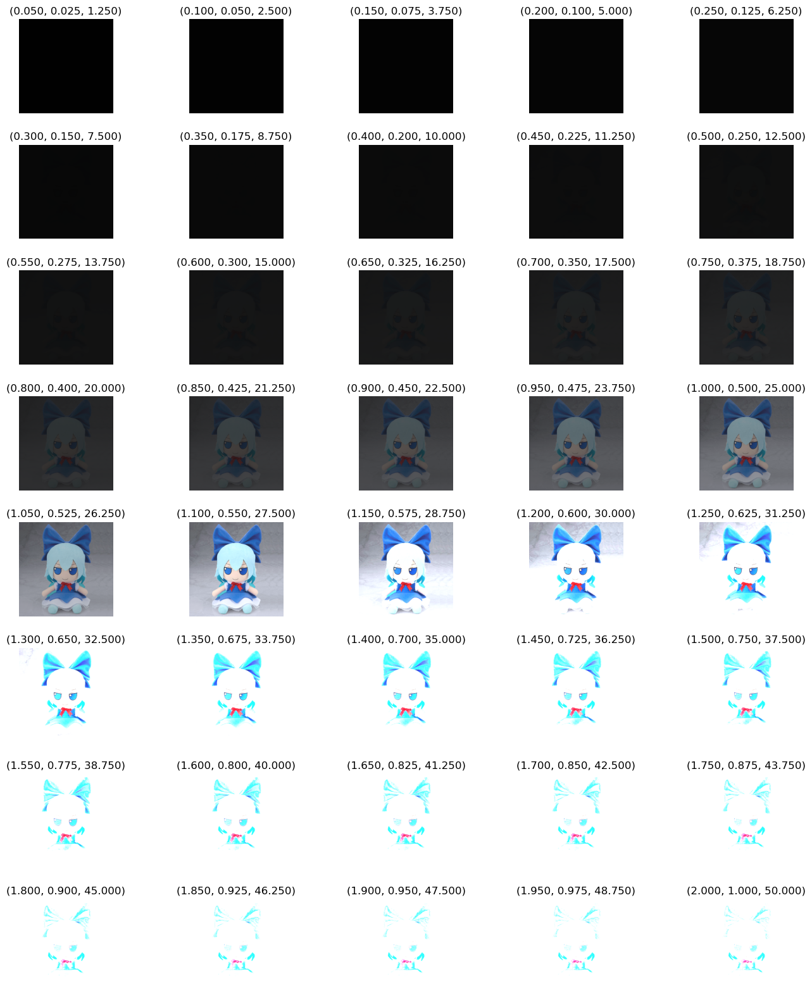

In [61]:
### START CODE HERE ###
fig = plt.figure(figsize=(32, 20))

grid = ImageGrid(
    fig, (1, 1, 1),
     nrows_ncols=(8, 5), axes_pad=(1.2, 0.5))
for i, ax in enumerate(grid):
    current_adjustment = gamma_adjustments[i]
    ax.imshow(cv2.cvtColor(current_adjustment.adjusted_display, cv2.COLOR_BGR2RGB))
    ax.set_title(f'({current_adjustment.gamma:.3f}, {current_adjustment.a:.3f}, {current_adjustment.b:.3f})')
    ax.axis('off')
# This only affects Axes in first column and second row as share_all=False.
grid.axes_llc.set(xticks=[-2, 0, 2], yticks=[-2, 0, 2])

plt.show()
### END CODE HERE ###

In [62]:
assert len(gam_result) >= 20, f"more than or equal 20 iterations but got {len(gam_result)}"
for idx, result in enumerate(gam_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Use `write_images_to_video()` and save the result.

In [64]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_gamma.mp4")
write_images_to_video(np.array(gam_result), output_file)

OpenCV: FFMPEG: tag 0x34363268/'h264' is not supported with codec id 27 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x31637661/'avc1'


Now use `matplotlib.animation` to display the animation from the images array.

In [66]:
%%capture
### START CODE HERE ###
figure, axes = plt.subplots()

frames = []
for i, frame in enumerate(gam_result):
    frame_uint8 = frame.astype(np.uint8)
    # frames.append(plt.imshow(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2RGB)))

    im = axes.imshow(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2RGB), animated=True)
    axes.axis('off')
    if i == 0:
        axes.imshow(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2RGB))  # show an initial one first
    frames.append([im])


ani = animation.ArtistAnimation(fig=figure, artists=frames, interval=50, blit=True)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![gamma2.gif](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/gamma.gif?raw=true)

</details>

In [67]:
display(HTML(ani.to_jshtml()))

---

## **Questions**
1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process